In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [ ]:
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [ ]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()

            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [ ]:
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    assert str(gen.__getitem__(4)).replace(' ', '') == f'Linear(in_features={hidden_dim * 8},out_features={im_dim},bias=True)'
    assert str(gen.__getitem__(5)).replace(' ', '') == 'Sigmoid()'
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


In [ ]:
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn((n_samples,z_dim),device=device)
    
    #### END CODE HERE ####

In [ ]:
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


In [ ]:
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim,output_dim),
        nn.LeakyReLU(0.2)
        #### END CODE HERE ####
    )

In [ ]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim,1)
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####

            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

## Training


In [ ]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [ ]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    noise = get_noise(num_images,z_dim,device)
    noise_p = gen(noise)
  
    noise_preds = disc(noise_p.detach())
    noise_true = torch.zeros_like(noise_preds)

    real_preds = disc(real)
    real_true = torch.ones_like(real_preds)
    disc_loss = (criterion(noise_preds,noise_true) + criterion(real_preds,real_true))/2



    #### END CODE HERE ####
    return disc_loss

In [ ]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    noise = get_noise(num_images,z_dim,device=device)
    fake = gen(noise)
    disc_preds = disc(fake)
    gen_loss = criterion(disc_preds,torch.ones_like(disc_preds))


    #### END CODE HERE ####
    return gen_loss

Step 500: Generator loss: 1.485516027331352, discriminator loss: 0.42997829419374467


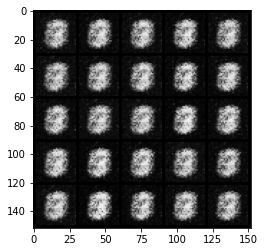

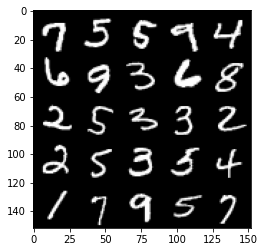

Step 1000: Generator loss: 1.8017252199649791, discriminator loss: 0.2813752897679807


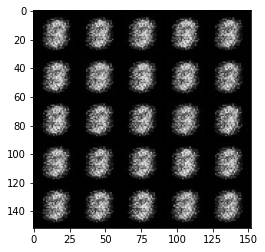

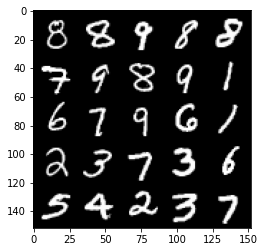

Step 1500: Generator loss: 2.1672690420150755, discriminator loss: 0.1504109679460525


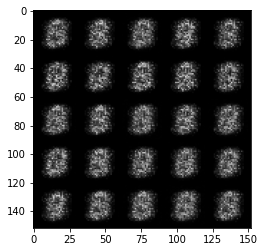

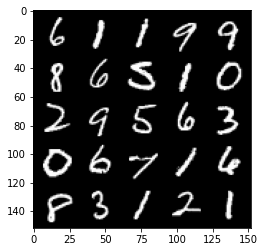

Step 2000: Generator loss: 1.788495732307436, discriminator loss: 0.2098247637748718


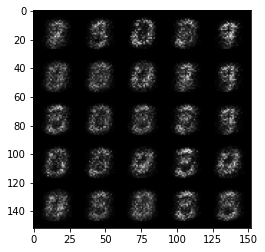

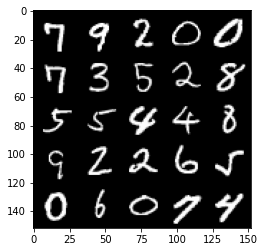

Step 2500: Generator loss: 1.544093844652175, discriminator loss: 0.24695019972324372


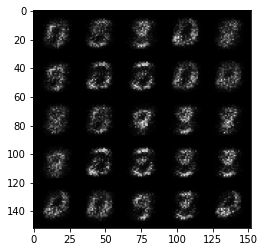

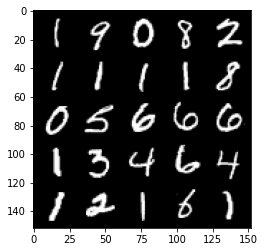

Step 3000: Generator loss: 1.697031513690949, discriminator loss: 0.20956472977995885


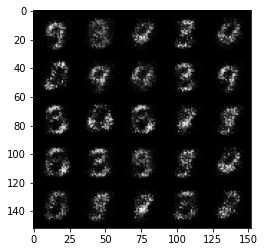

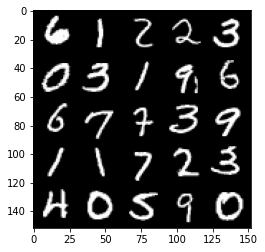

Step 3500: Generator loss: 1.9795911736488343, discriminator loss: 0.18768027260899559


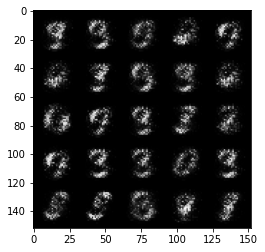

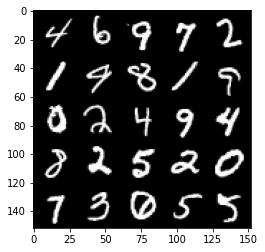

Step 4000: Generator loss: 2.3854434094429013, discriminator loss: 0.14539587686955932


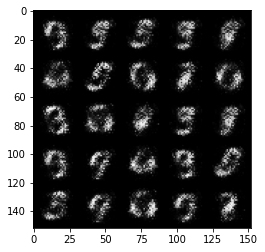

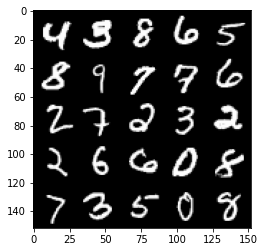

Step 4500: Generator loss: 2.832465163707731, discriminator loss: 0.10384980928897868


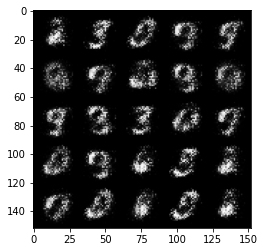

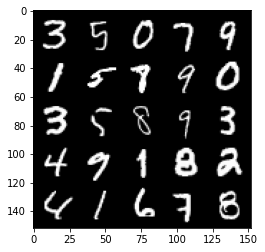

Step 5000: Generator loss: 3.2664539279937763, discriminator loss: 0.08163959502428766


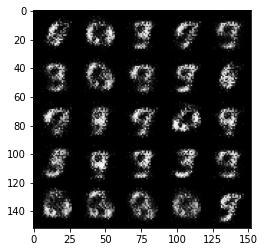

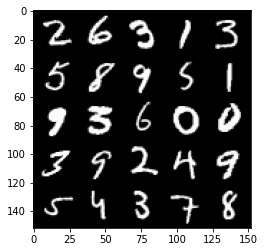

Step 5500: Generator loss: 3.4885321340560953, discriminator loss: 0.0818811154738068


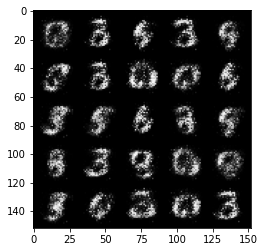

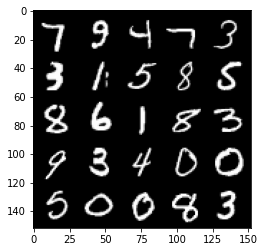

Step 6000: Generator loss: 3.5731852307319634, discriminator loss: 0.08671542841196059


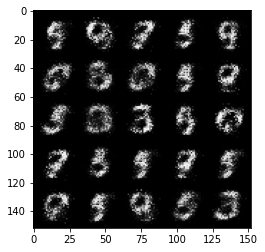

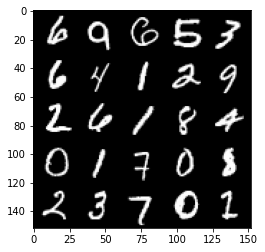

Step 6500: Generator loss: 3.700194994926455, discriminator loss: 0.0864903004989028


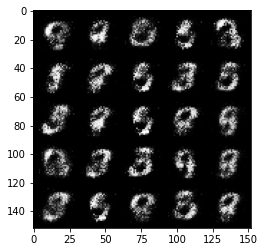

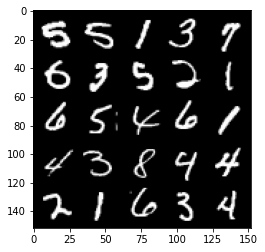

Step 7000: Generator loss: 3.8004895200729294, discriminator loss: 0.07261770949512723


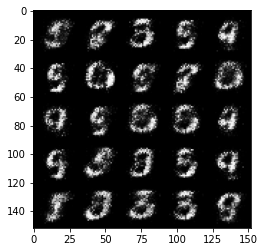

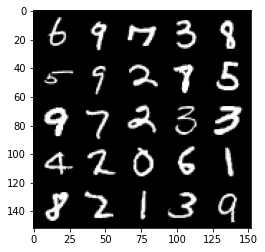

Step 7500: Generator loss: 3.8799123468399044, discriminator loss: 0.0748621888235211


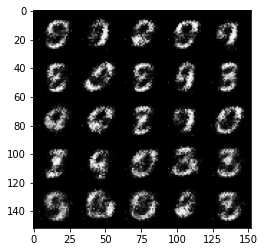

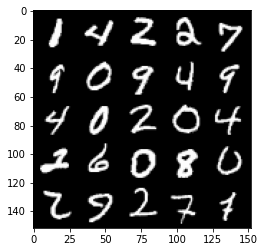

Step 8000: Generator loss: 3.8642921977043176, discriminator loss: 0.0767475100532174


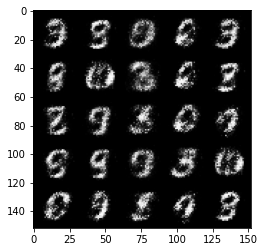

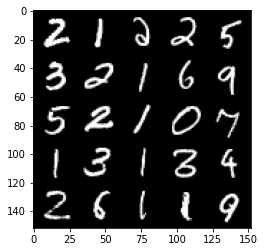

Step 8500: Generator loss: 3.8995470113754287, discriminator loss: 0.0737237172424793


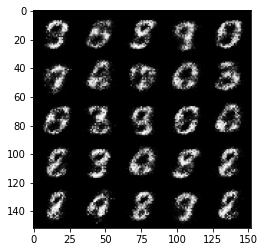

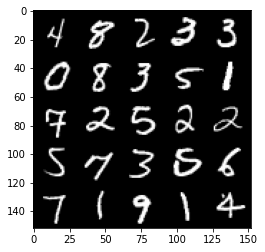

Step 9000: Generator loss: 3.8366446514129633, discriminator loss: 0.07431414647400388


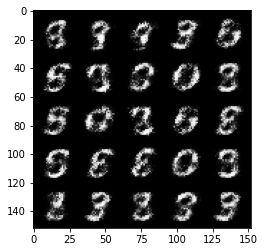

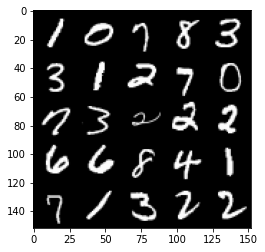

Step 9500: Generator loss: 3.9901985745429975, discriminator loss: 0.07213318961113682


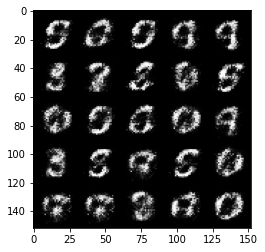

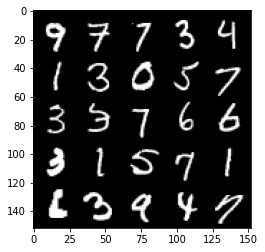

Step 10000: Generator loss: 4.155483247280124, discriminator loss: 0.06950411604344846


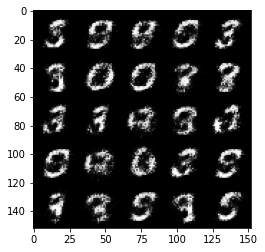

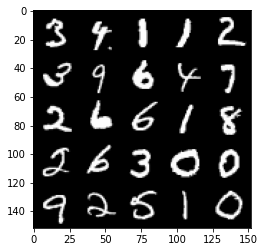

Step 10500: Generator loss: 4.185631174087526, discriminator loss: 0.06583352495729923


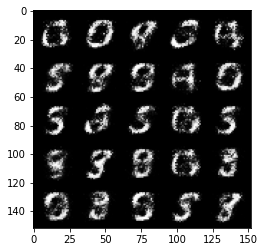

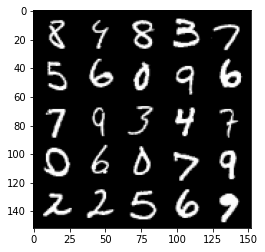

Step 11000: Generator loss: 4.054871733188632, discriminator loss: 0.06997899168729785


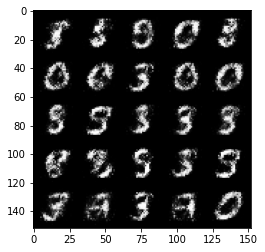

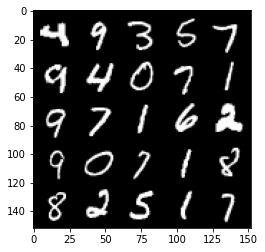

Step 11500: Generator loss: 3.9653300719261146, discriminator loss: 0.07532627524808054


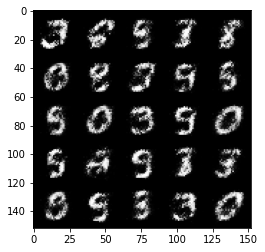

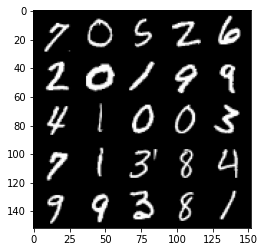

Step 12000: Generator loss: 4.179700569629666, discriminator loss: 0.07436191484332083


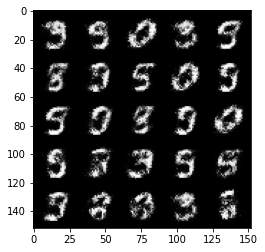

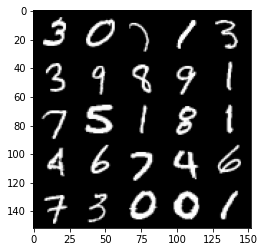

Step 12500: Generator loss: 4.227684626579281, discriminator loss: 0.07381563183665274


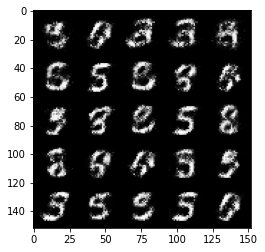

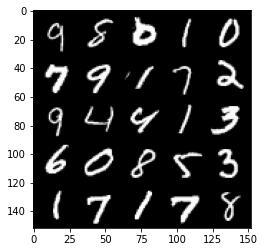

Step 13000: Generator loss: 3.942170783996579, discriminator loss: 0.08818205154687167


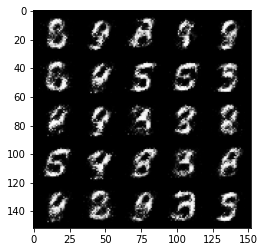

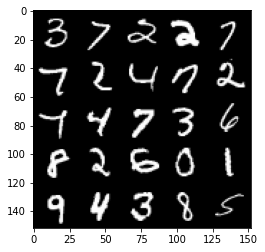

Step 13500: Generator loss: 3.8295189213752736, discriminator loss: 0.09970393025875098


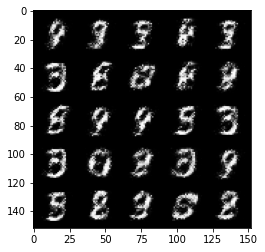

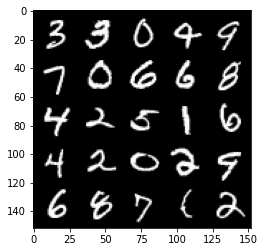

Step 14000: Generator loss: 3.671439476966857, discriminator loss: 0.1108679465278982


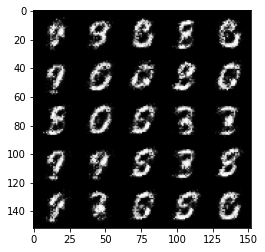

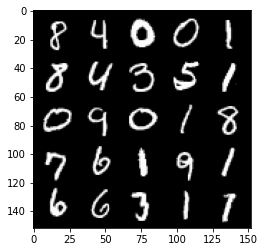

Step 14500: Generator loss: 3.7717057943344083, discriminator loss: 0.10092541003227229


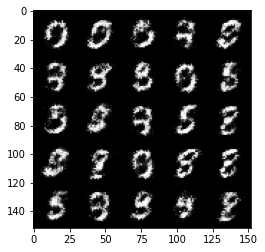

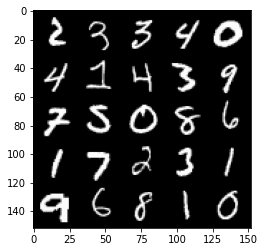

Step 15000: Generator loss: 3.927277364253998, discriminator loss: 0.09272179549187429


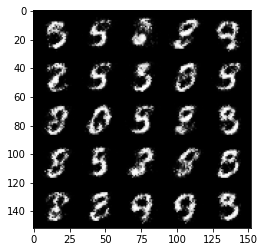

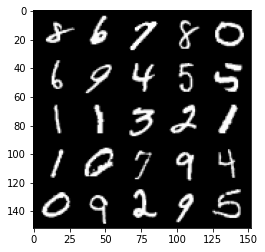

Step 15500: Generator loss: 3.766588372230526, discriminator loss: 0.10759255881607542


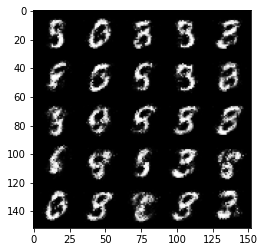

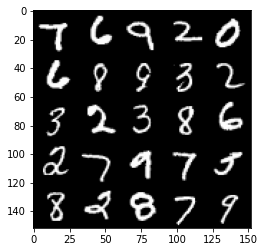

Step 16000: Generator loss: 3.617646076679229, discriminator loss: 0.12773394966125484


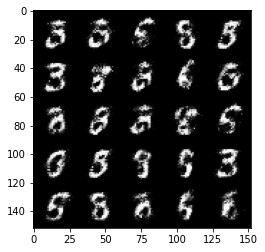

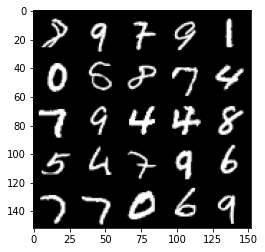

Step 16500: Generator loss: 3.6409212460517884, discriminator loss: 0.12597396963834767


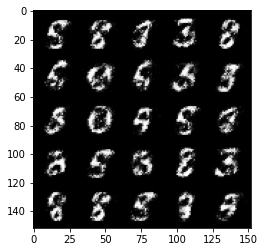

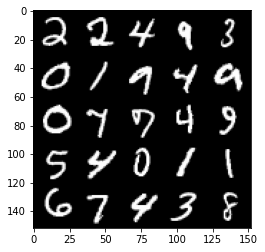

Step 17000: Generator loss: 3.502315824508667, discriminator loss: 0.1410084721893072


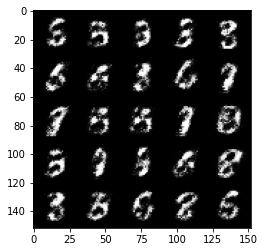

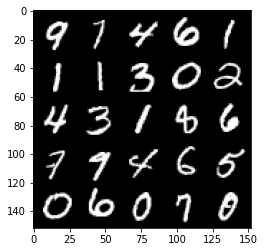

Step 17500: Generator loss: 3.3964122128486665, discriminator loss: 0.14532098360359663


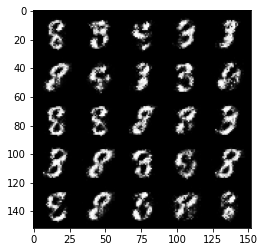

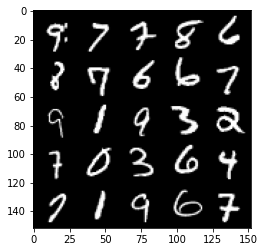

Step 18000: Generator loss: 3.3449431419372533, discriminator loss: 0.15386093926429747


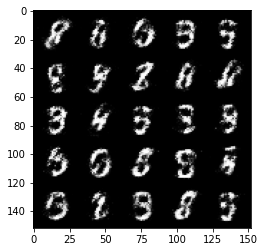

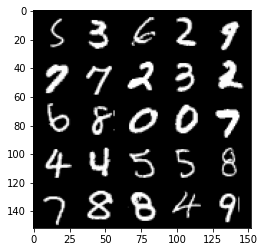

Step 18500: Generator loss: 3.2824855103492716, discriminator loss: 0.15704762770235528


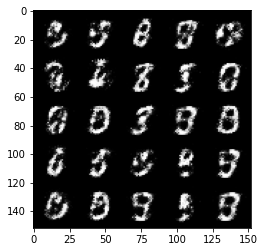

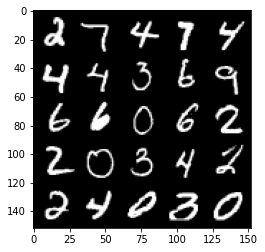

Step 19000: Generator loss: 3.2405038442611658, discriminator loss: 0.17428234058618547


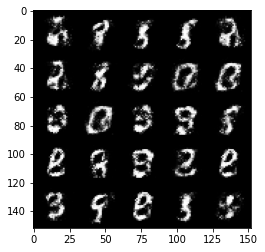

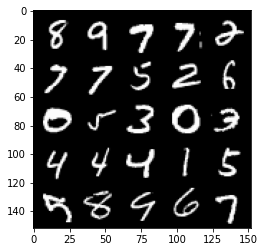

Step 19500: Generator loss: 3.1372533826828017, discriminator loss: 0.19072125147283073


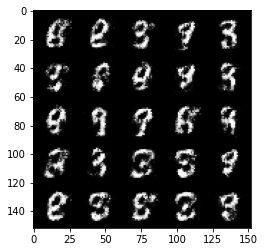

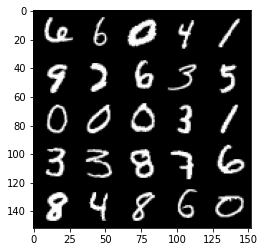

Step 20000: Generator loss: 3.241820540905001, discriminator loss: 0.16049971909821031


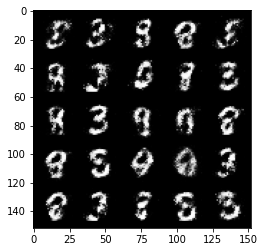

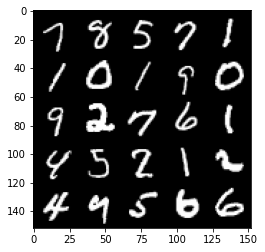

Step 20500: Generator loss: 3.2221734938621522, discriminator loss: 0.1725994372963907


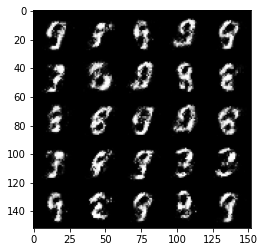

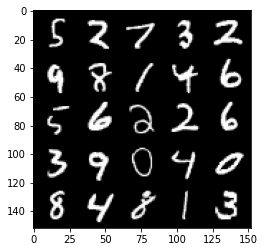

Step 21000: Generator loss: 3.021936394691467, discriminator loss: 0.17951373086869718


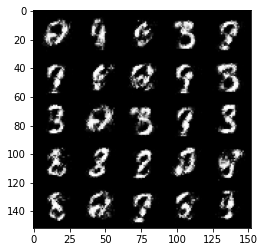

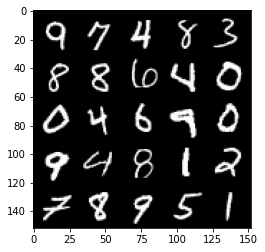

Step 21500: Generator loss: 3.141688826084137, discriminator loss: 0.17427520368993255


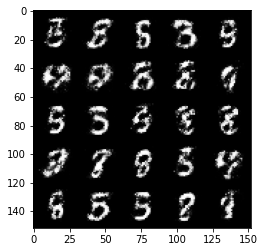

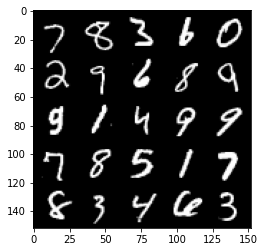

Step 22000: Generator loss: 3.0422152442932107, discriminator loss: 0.17944701020419618


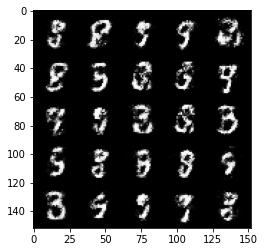

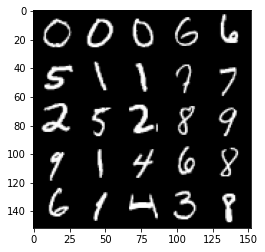

Step 22500: Generator loss: 2.922240986824033, discriminator loss: 0.1978269361257553


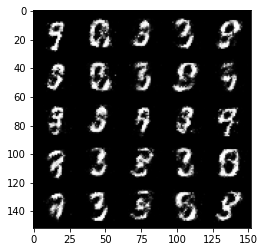

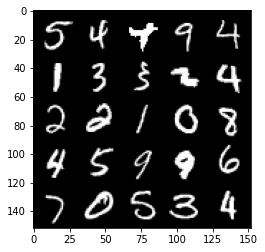

Step 23000: Generator loss: 2.995014522552492, discriminator loss: 0.18729379288852202


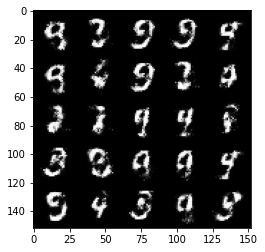

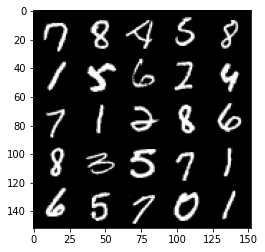

Step 23500: Generator loss: 2.9764607887268077, discriminator loss: 0.18662690094113354


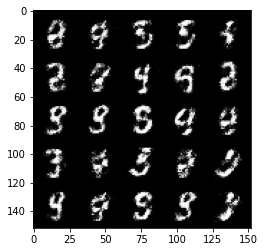

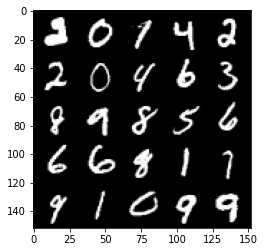

Step 24000: Generator loss: 2.9358118777275077, discriminator loss: 0.19058552527427683


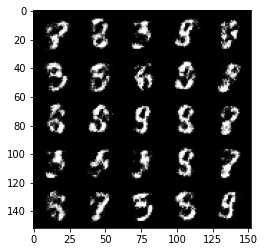

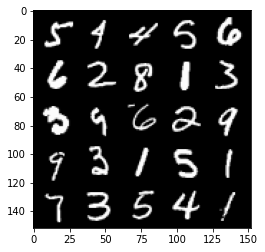

Step 24500: Generator loss: 2.9188430404663066, discriminator loss: 0.19947942902147772


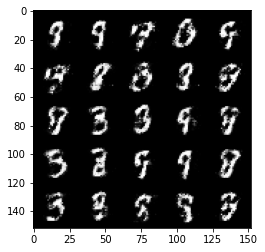

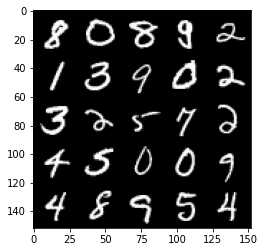

Step 25000: Generator loss: 2.7443192491531367, discriminator loss: 0.23342596274614325


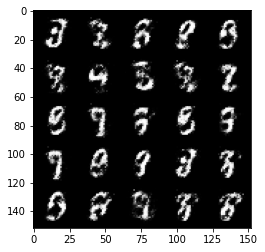

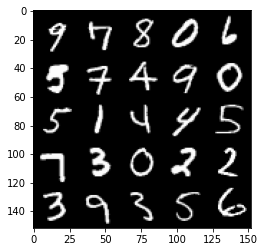

Step 25500: Generator loss: 2.596349058389665, discriminator loss: 0.2457202015519142


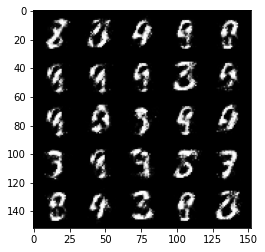

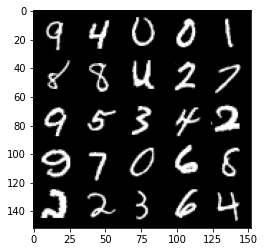

Step 26000: Generator loss: 2.706312260150912, discriminator loss: 0.21028817167878178


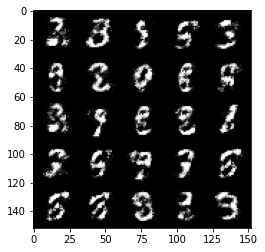

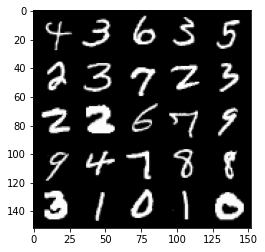

Step 26500: Generator loss: 2.895826872348783, discriminator loss: 0.19430157354474056


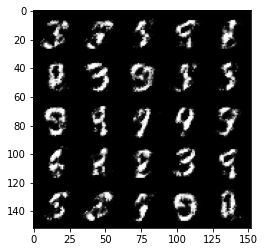

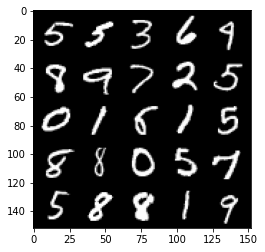

Step 27000: Generator loss: 2.74600199508667, discriminator loss: 0.21670830290019516


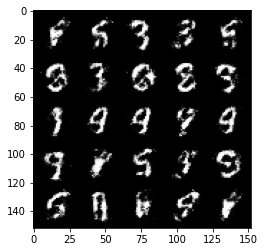

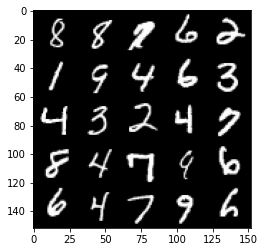

Step 27500: Generator loss: 2.7188097372055013, discriminator loss: 0.22337290939688695


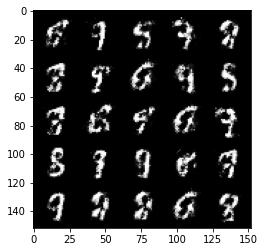

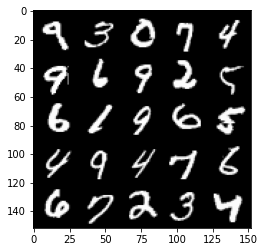

Step 28000: Generator loss: 2.7691503133773794, discriminator loss: 0.21211113783717184


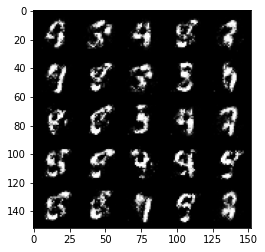

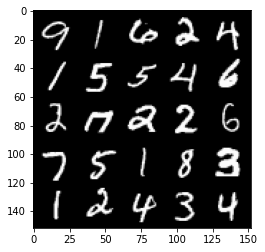

Step 28500: Generator loss: 2.7054567275047288, discriminator loss: 0.2311920552253723


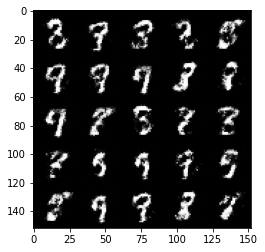

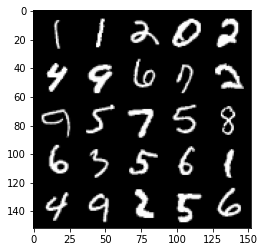

Step 29000: Generator loss: 2.6624082264900215, discriminator loss: 0.2265957895517349


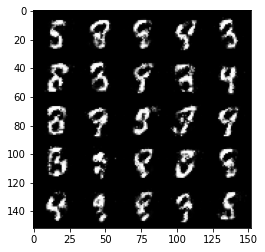

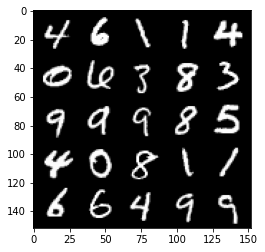

Step 29500: Generator loss: 2.5539824151992794, discriminator loss: 0.24313061457872373


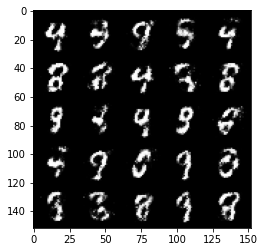

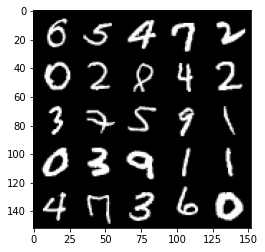

Step 30000: Generator loss: 2.5357822628021234, discriminator loss: 0.246080965936184


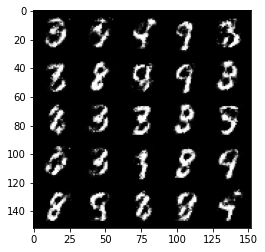

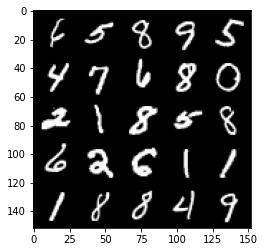

Step 30500: Generator loss: 2.540485510110853, discriminator loss: 0.23935959362983716


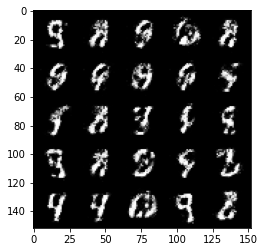

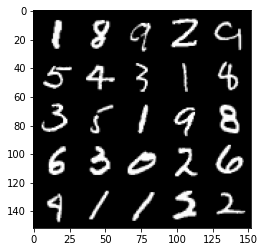

Step 31000: Generator loss: 2.528240509986876, discriminator loss: 0.2531915721297263


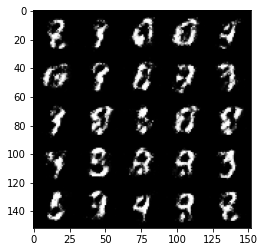

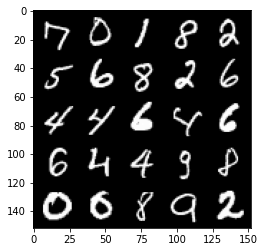

Step 31500: Generator loss: 2.4982316756248473, discriminator loss: 0.2411787376403808


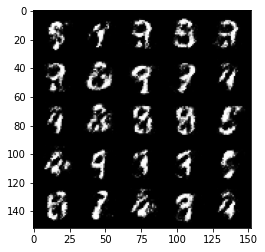

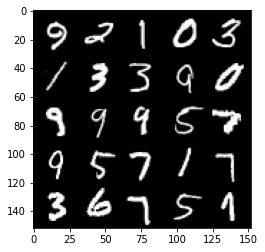

Step 32000: Generator loss: 2.5467168946266177, discriminator loss: 0.2446108529865743


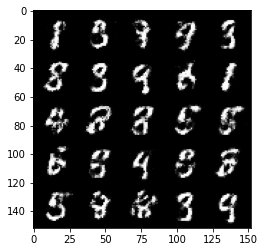

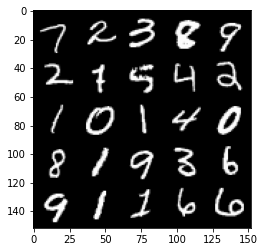

Step 32500: Generator loss: 2.4578257632255562, discriminator loss: 0.2595045388340948


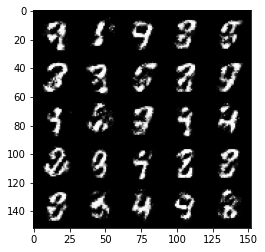

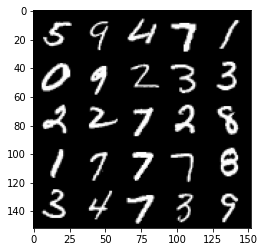

Step 33000: Generator loss: 2.4587242906093585, discriminator loss: 0.25510639774799365


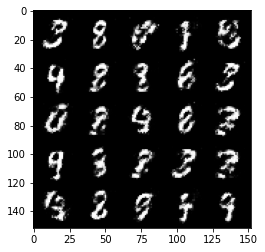

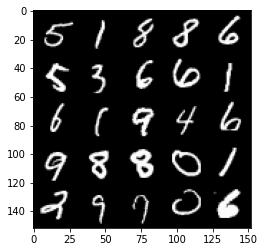

Step 33500: Generator loss: 2.4033494203090675, discriminator loss: 0.270366559535265


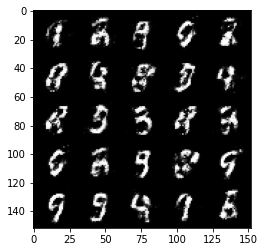

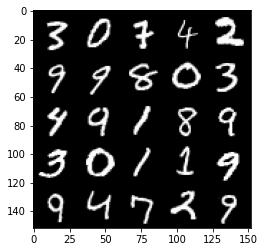

Step 34000: Generator loss: 2.339909273624421, discriminator loss: 0.2836482835412025


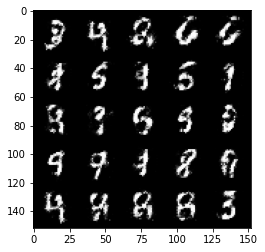

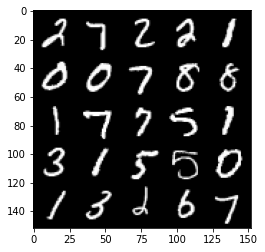

Step 34500: Generator loss: 2.418121320962907, discriminator loss: 0.26204586839675914


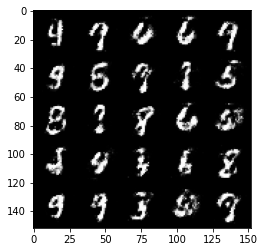

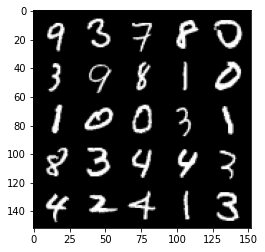

Step 35000: Generator loss: 2.3528784127235416, discriminator loss: 0.27834631988406205


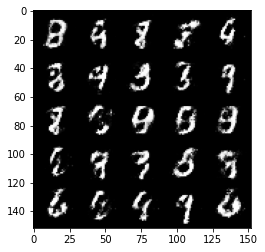

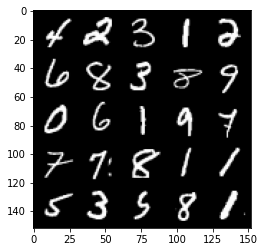

Step 35500: Generator loss: 2.283737810611725, discriminator loss: 0.28519277122616754


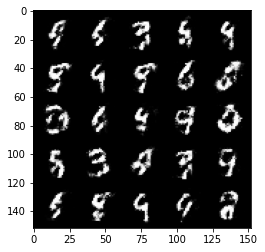

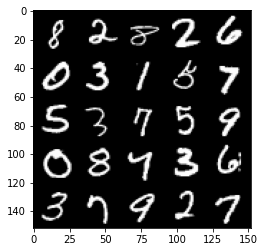

Step 36000: Generator loss: 2.275180221796035, discriminator loss: 0.291875756621361


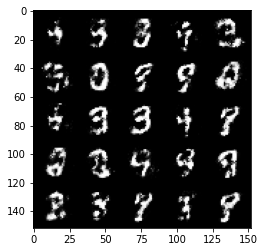

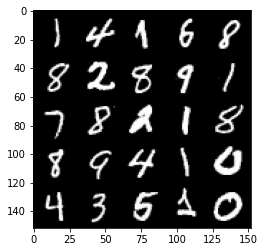

Step 36500: Generator loss: 2.185258216381075, discriminator loss: 0.2952009120583535


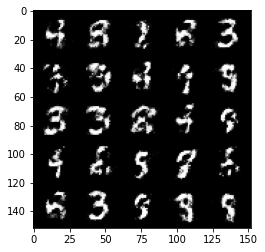

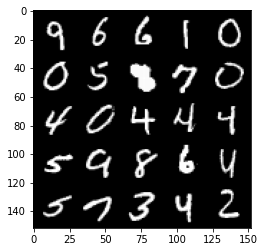

Step 37000: Generator loss: 2.2058281116485605, discriminator loss: 0.29518902382254597


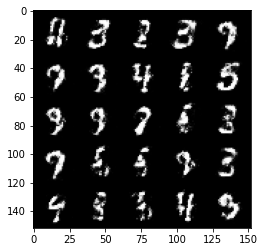

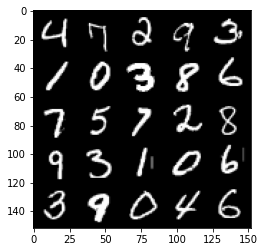

Step 37500: Generator loss: 2.2155703206062323, discriminator loss: 0.2962732907831672


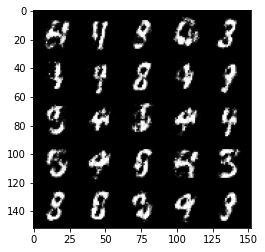

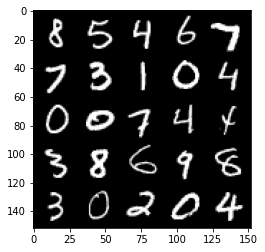

Step 38000: Generator loss: 2.172168430805206, discriminator loss: 0.2976989270150661


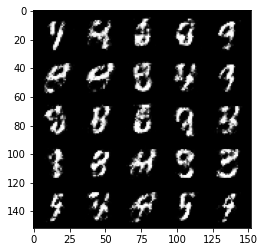

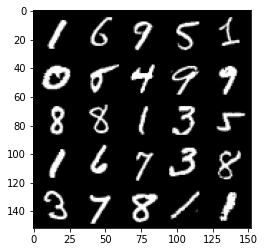

Step 38500: Generator loss: 2.2770551717281333, discriminator loss: 0.27465019395947426


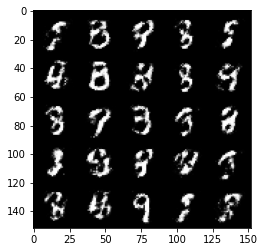

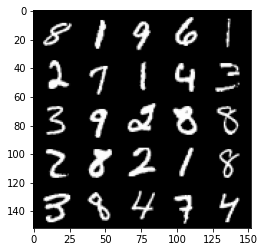

Step 39000: Generator loss: 2.2491370713710777, discriminator loss: 0.28747571042180065


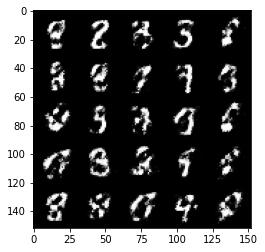

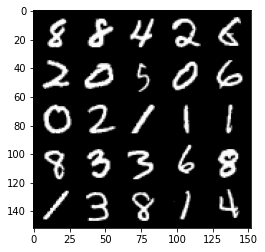

Step 39500: Generator loss: 2.220768967151643, discriminator loss: 0.285622807174921


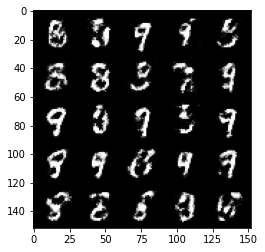

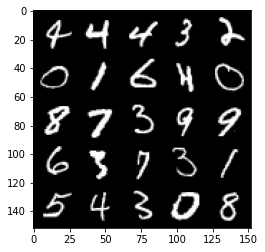

Step 40000: Generator loss: 2.2302819614410376, discriminator loss: 0.3016747049987315


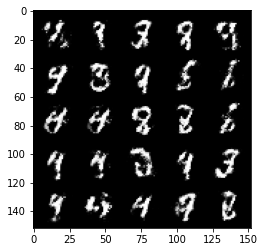

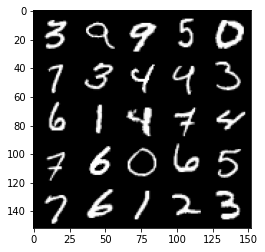

Step 40500: Generator loss: 2.224992716789246, discriminator loss: 0.2945516439974309


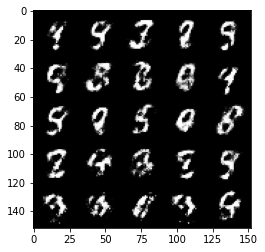

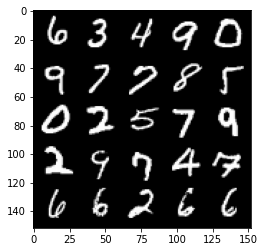

Step 41000: Generator loss: 2.2990169308185555, discriminator loss: 0.2715568284988403


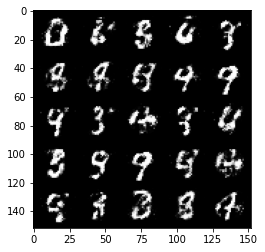

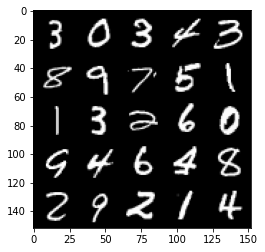

Step 41500: Generator loss: 2.308451811552047, discriminator loss: 0.2838110404908658


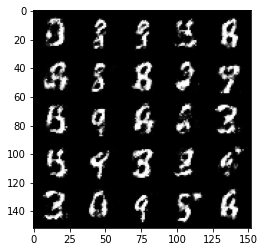

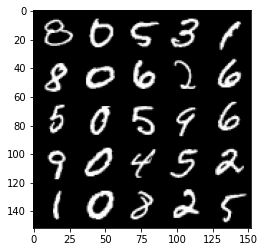

Step 42000: Generator loss: 2.108156683683396, discriminator loss: 0.3147922320663928


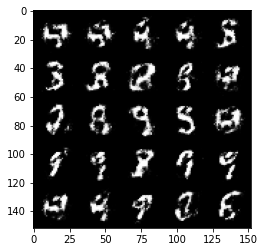

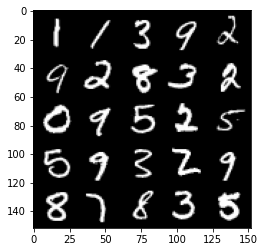

Step 42500: Generator loss: 2.2278529934883107, discriminator loss: 0.28100582423806186


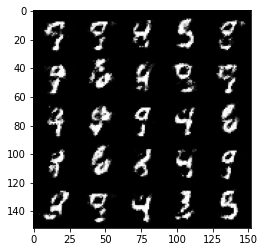

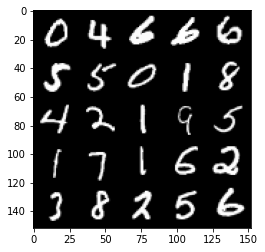

Step 43000: Generator loss: 2.115795530796051, discriminator loss: 0.3037754693031311


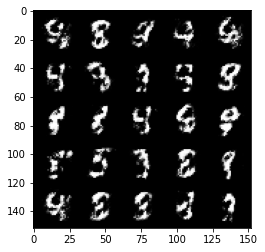

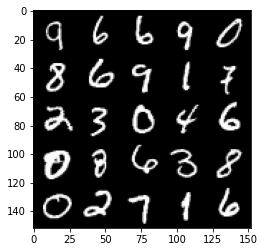

Step 43500: Generator loss: 2.214255636453629, discriminator loss: 0.28672096368670486


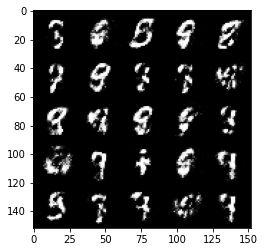

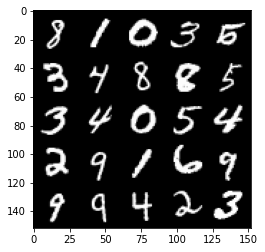

Step 44000: Generator loss: 2.1551781570911395, discriminator loss: 0.30372760114073766


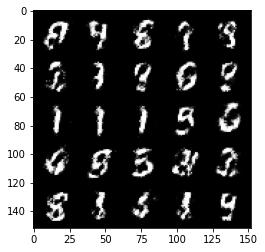

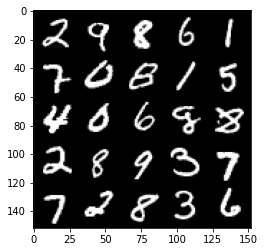

Step 44500: Generator loss: 2.2087578670978543, discriminator loss: 0.28574789407849294


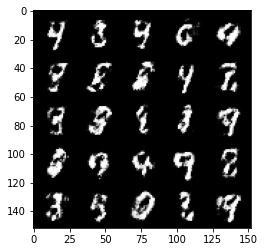

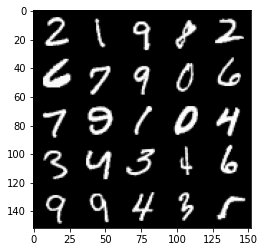

Step 45000: Generator loss: 2.1420985496044143, discriminator loss: 0.31410774984955797


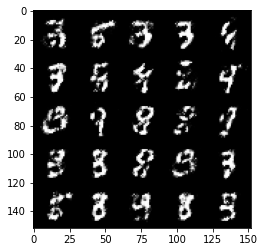

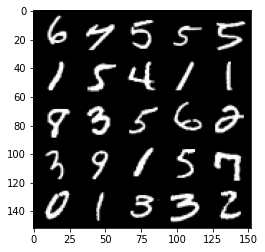

Step 45500: Generator loss: 2.0921502397060396, discriminator loss: 0.31661374422907834


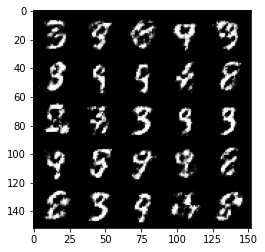

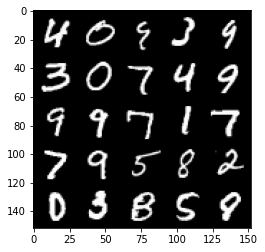

Step 46000: Generator loss: 2.069893122434615, discriminator loss: 0.34296315047144843


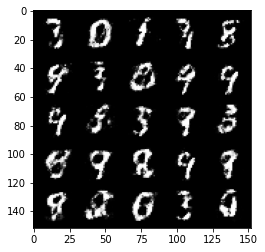

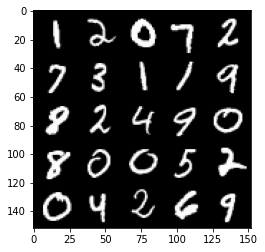

Step 46500: Generator loss: 2.034236764907836, discriminator loss: 0.33638499587774284


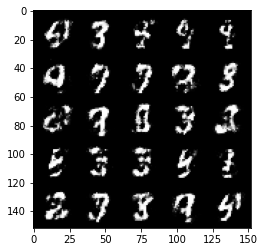

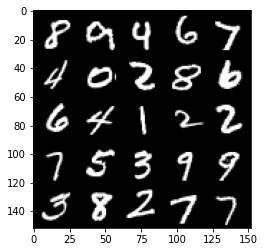

Step 47000: Generator loss: 2.102895425319671, discriminator loss: 0.30845883685350417


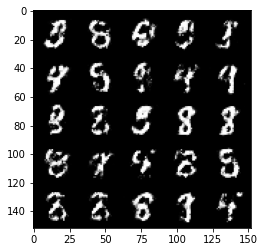

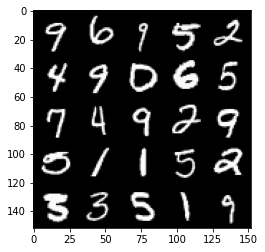

Step 47500: Generator loss: 2.149540553808215, discriminator loss: 0.29532567664980885


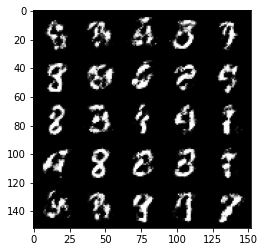

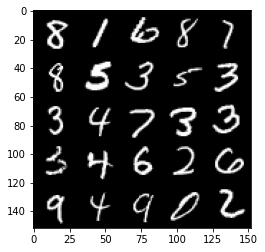

Step 48000: Generator loss: 2.090750369548796, discriminator loss: 0.30996873244643197


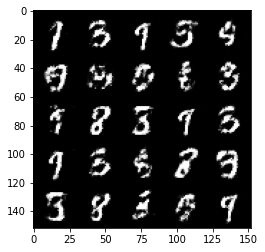

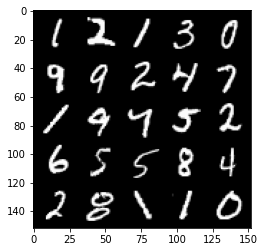

Step 48500: Generator loss: 2.042202206850051, discriminator loss: 0.32915364500880195


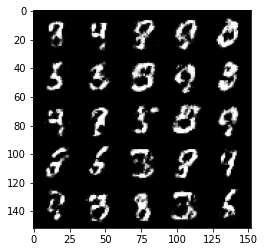

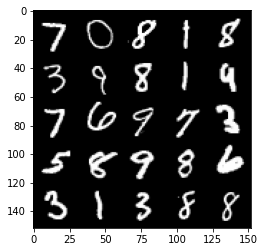

Step 49000: Generator loss: 2.0631171927452088, discriminator loss: 0.3140185330212117


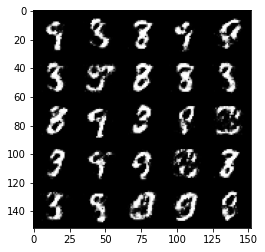

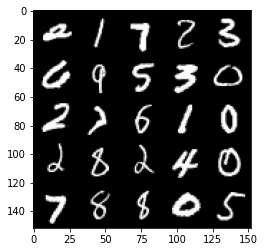

Step 49500: Generator loss: 2.0369025771617877, discriminator loss: 0.33220260363817194


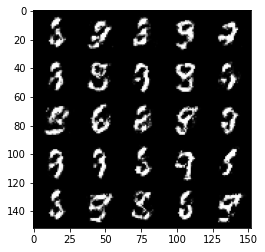

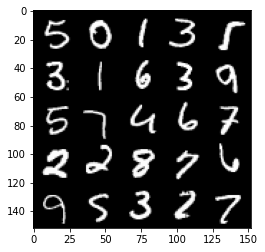

Step 50000: Generator loss: 1.9974444167613985, discriminator loss: 0.3442876681983472


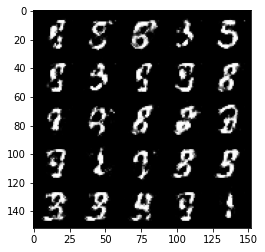

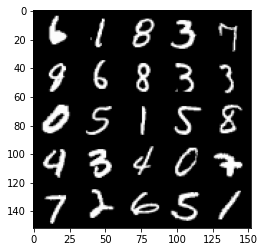

Step 50500: Generator loss: 1.952708758831024, discriminator loss: 0.3417127004861831


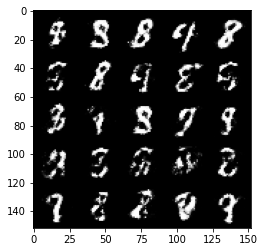

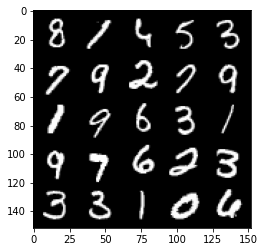

Step 51000: Generator loss: 1.8249764375686666, discriminator loss: 0.36217927190661403


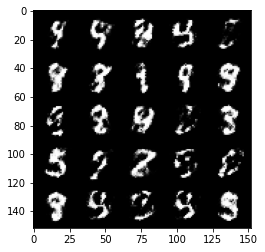

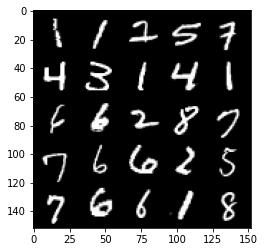

Step 51500: Generator loss: 1.8557587859630589, discriminator loss: 0.34884477311372797


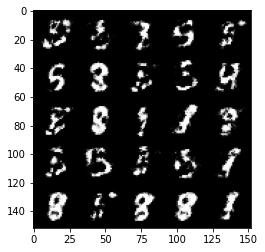

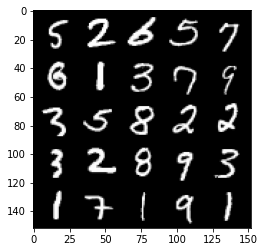

Step 52000: Generator loss: 1.837403812408446, discriminator loss: 0.3626293340027329


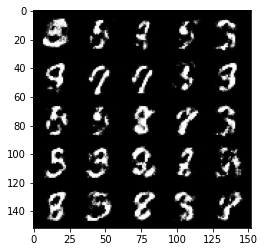

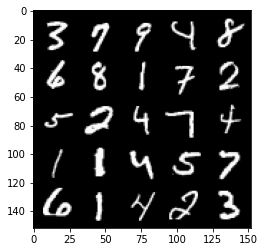

Step 52500: Generator loss: 1.8554171085357654, discriminator loss: 0.36394317224621797


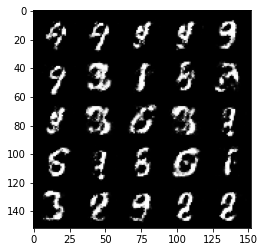

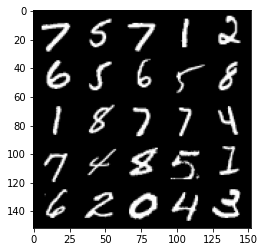

Step 53000: Generator loss: 1.7630329239368445, discriminator loss: 0.3858157458305357


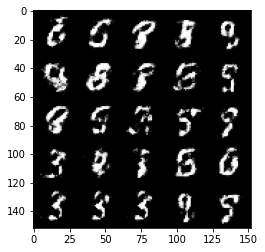

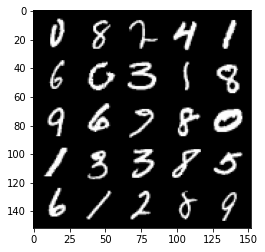

Step 53500: Generator loss: 1.7568495576381677, discriminator loss: 0.3761070266366003


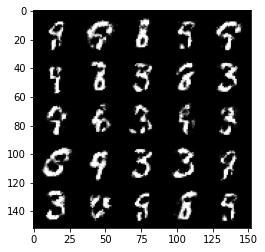

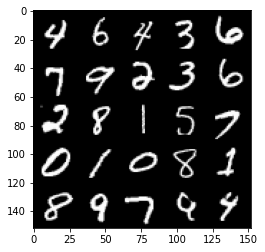

Step 54000: Generator loss: 1.7289235444068913, discriminator loss: 0.39290051442384705


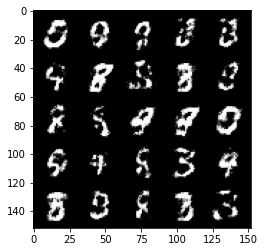

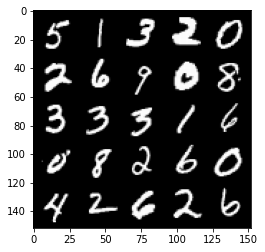

Step 54500: Generator loss: 1.6927600922584531, discriminator loss: 0.3936263656020164


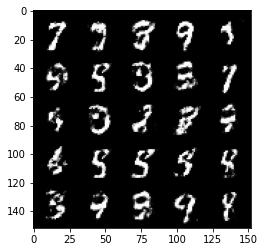

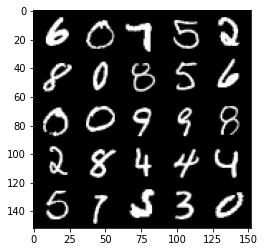

Step 55000: Generator loss: 1.7198261959552774, discriminator loss: 0.39342039811611135


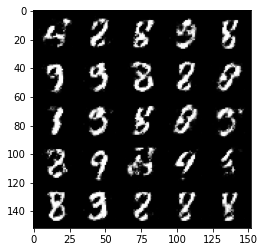

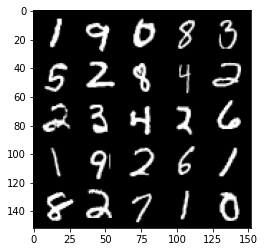

Step 55500: Generator loss: 1.7704885480403891, discriminator loss: 0.3741332235336303


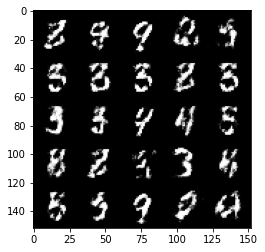

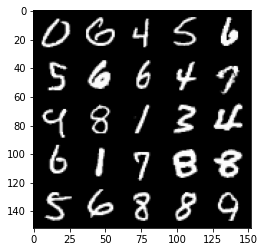

Step 56000: Generator loss: 1.7809602625370027, discriminator loss: 0.3749829018115996


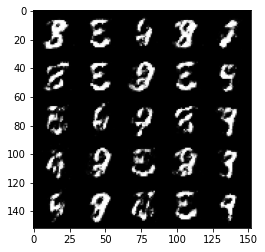

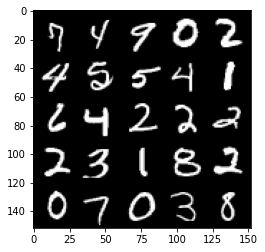

Step 56500: Generator loss: 1.7456494700908642, discriminator loss: 0.3814204773902892


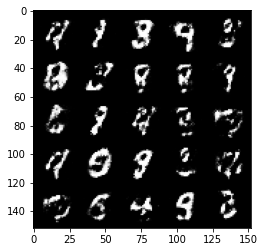

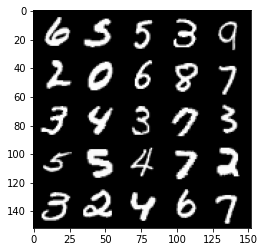

Step 57000: Generator loss: 1.6763328890800482, discriminator loss: 0.4034551383852958


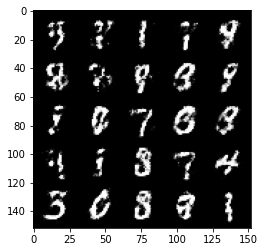

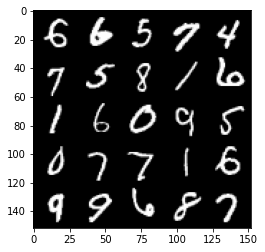

Step 57500: Generator loss: 1.673592386722566, discriminator loss: 0.40249711358547186


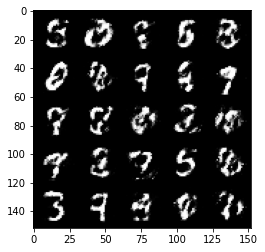

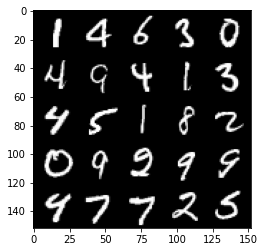

Step 58000: Generator loss: 1.561007541656495, discriminator loss: 0.4425858070850377


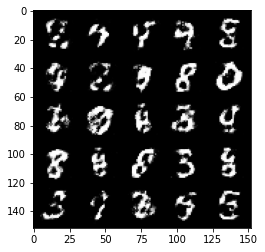

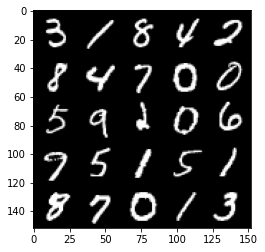

Step 58500: Generator loss: 1.6630349965095519, discriminator loss: 0.3931461486816406


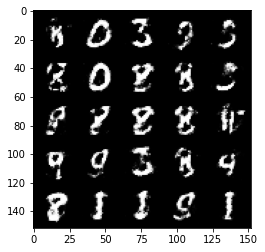

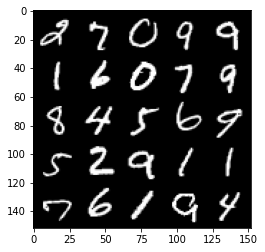

Step 59000: Generator loss: 1.6787776079177854, discriminator loss: 0.38939721596240995


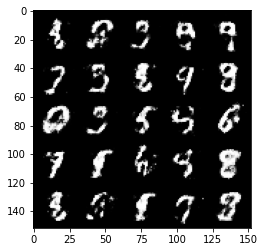

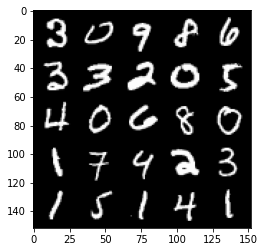

Step 59500: Generator loss: 1.6062184913158413, discriminator loss: 0.40419421690702445


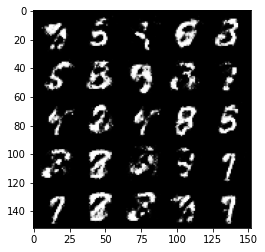

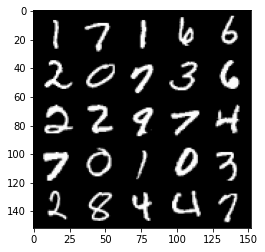

Step 60000: Generator loss: 1.6558775563240067, discriminator loss: 0.39360375630855554


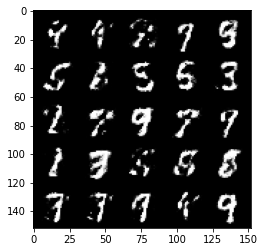

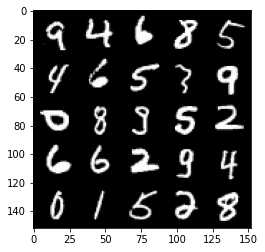

Step 60500: Generator loss: 1.7687515685558333, discriminator loss: 0.3634189056158068


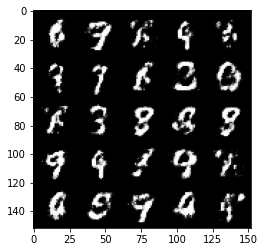

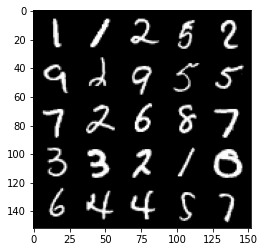

Step 61000: Generator loss: 1.709007128715515, discriminator loss: 0.39506822746992126


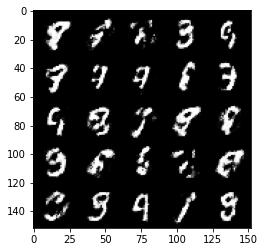

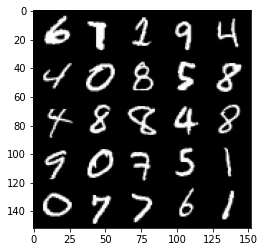

Step 61500: Generator loss: 1.6447408876419067, discriminator loss: 0.4068808869719501


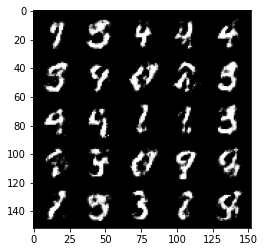

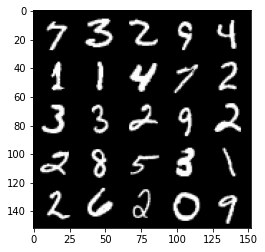

Step 62000: Generator loss: 1.6455373609066006, discriminator loss: 0.3971532781124111


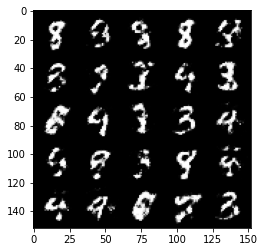

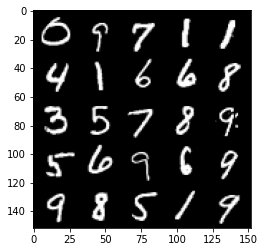

Step 62500: Generator loss: 1.7237821855545046, discriminator loss: 0.37677755016088466


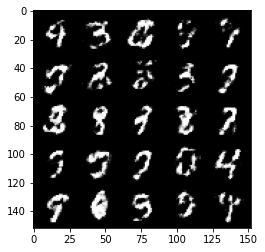

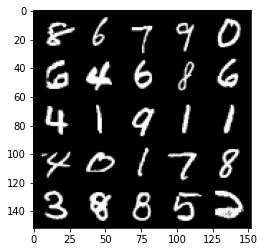

Step 63000: Generator loss: 1.5457178845405586, discriminator loss: 0.43249377810955053


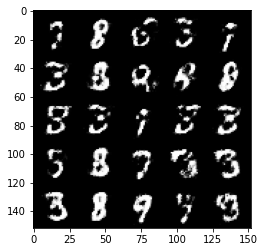

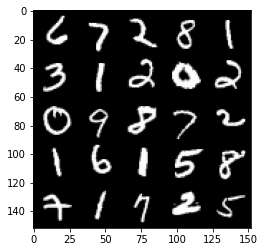

Step 63500: Generator loss: 1.6494464132785795, discriminator loss: 0.38180781245231604


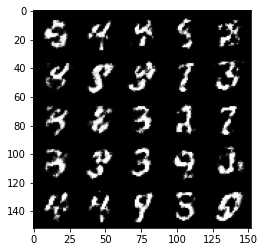

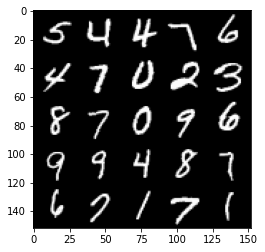

Step 64000: Generator loss: 1.7018521084785472, discriminator loss: 0.38713243025541305


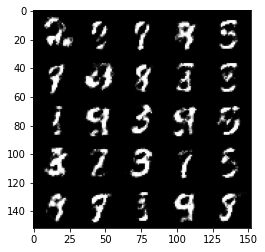

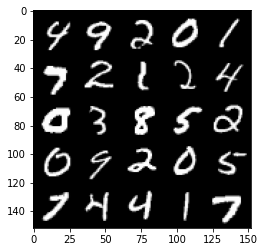

Step 64500: Generator loss: 1.5465043096542348, discriminator loss: 0.4334907746911052


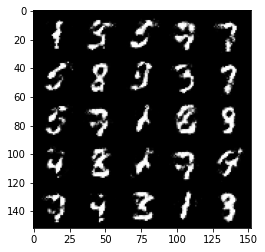

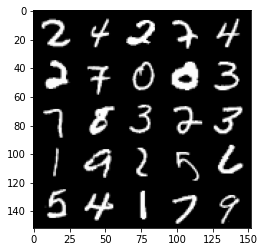

Step 65000: Generator loss: 1.5432131128311146, discriminator loss: 0.4267337905168535


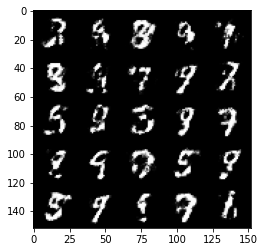

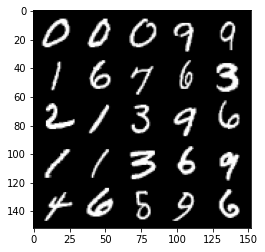

Step 65500: Generator loss: 1.5669790756702422, discriminator loss: 0.4150414367914201


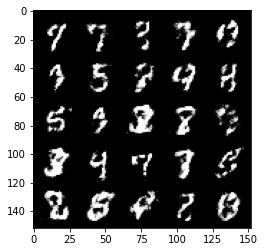

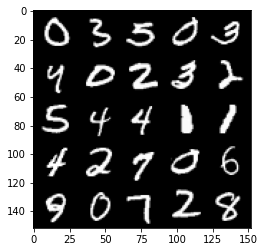

Step 66000: Generator loss: 1.438046678543091, discriminator loss: 0.4578094475865358


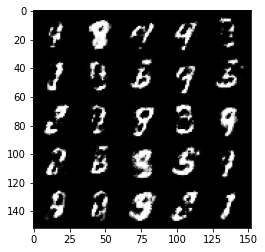

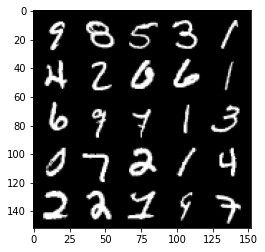

Step 66500: Generator loss: 1.5247618286609652, discriminator loss: 0.414470917224884


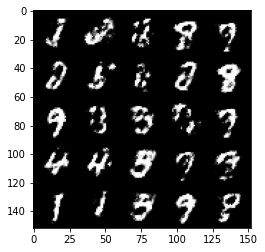

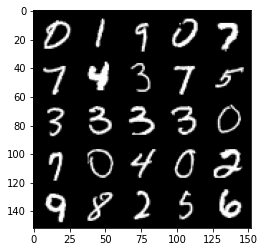

Step 67000: Generator loss: 1.52516271829605, discriminator loss: 0.42781558769941347


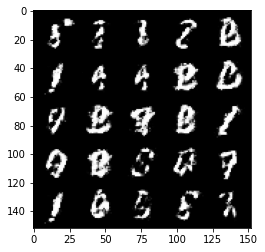

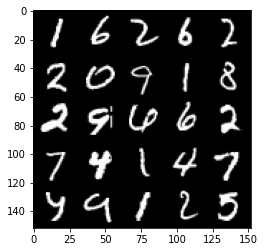

Step 67500: Generator loss: 1.4812823877334582, discriminator loss: 0.43653207612037653


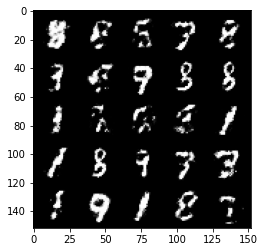

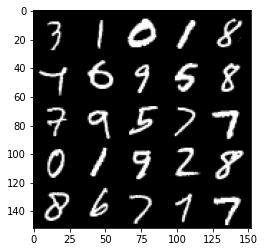

Step 68000: Generator loss: 1.5437402629852284, discriminator loss: 0.430484016120434


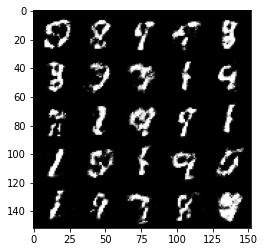

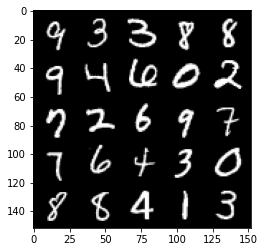

Step 68500: Generator loss: 1.5711476860046387, discriminator loss: 0.4312419846653941


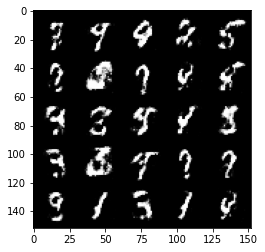

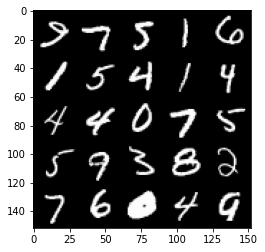

Step 69000: Generator loss: 1.5211134057044988, discriminator loss: 0.4351390034556386


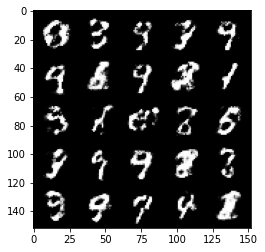

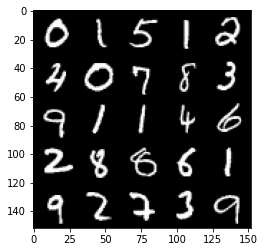

Step 69500: Generator loss: 1.4901865293979637, discriminator loss: 0.45053705930709864


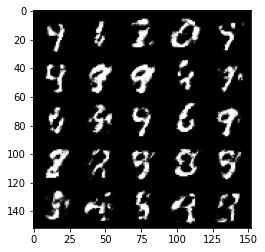

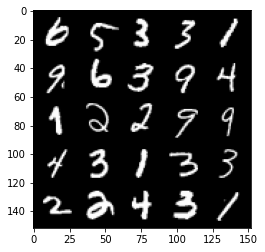

Step 70000: Generator loss: 1.5300221900939939, discriminator loss: 0.425762262761593


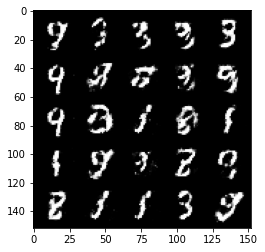

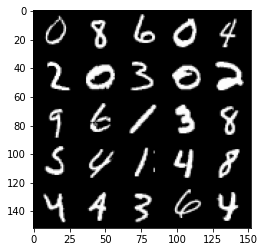

Step 70500: Generator loss: 1.5117031447887415, discriminator loss: 0.42677336895465834


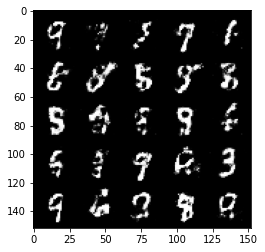

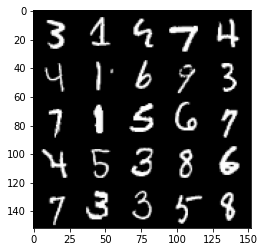

Step 71000: Generator loss: 1.5492885835170744, discriminator loss: 0.41875230306386957


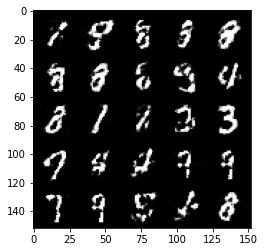

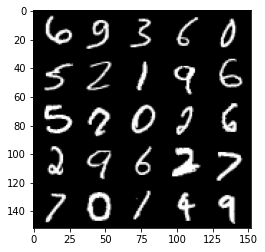

Step 71500: Generator loss: 1.456043013095856, discriminator loss: 0.45053506487607975


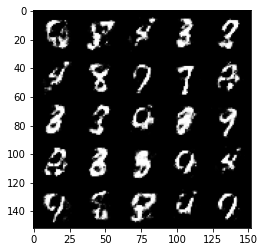

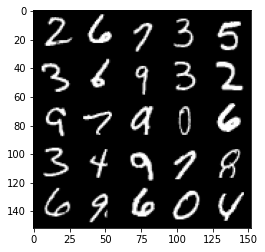

Step 72000: Generator loss: 1.4545118925571443, discriminator loss: 0.43944456541538246


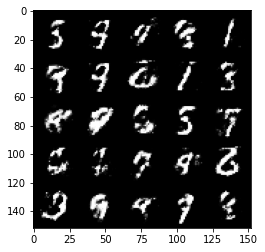

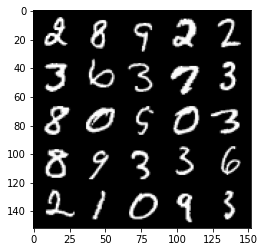

Step 72500: Generator loss: 1.408375444412233, discriminator loss: 0.463020451247692


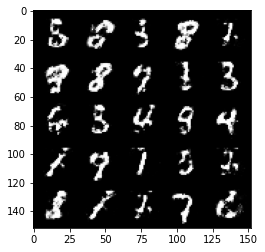

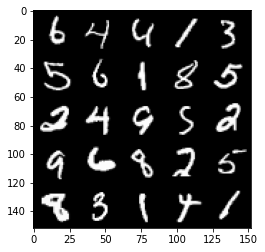

Step 73000: Generator loss: 1.4876068983078008, discriminator loss: 0.43610976755619035


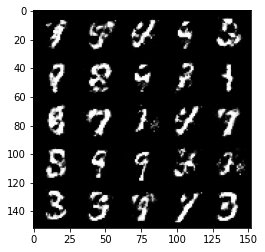

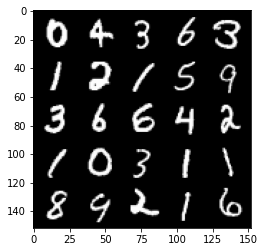

Step 73500: Generator loss: 1.5134302299022675, discriminator loss: 0.4213581124544143


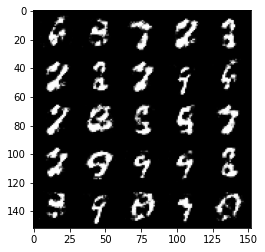

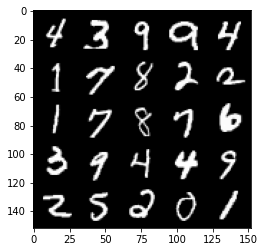

Step 74000: Generator loss: 1.5864488506317145, discriminator loss: 0.4173134549260141


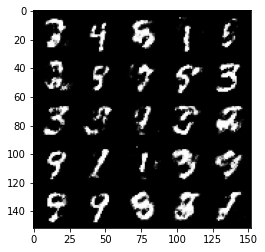

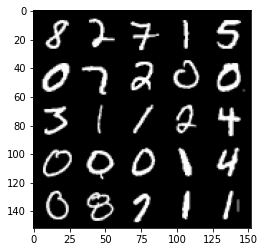

Step 74500: Generator loss: 1.4698813238143908, discriminator loss: 0.43824711704254116


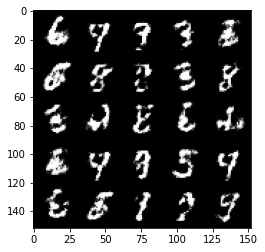

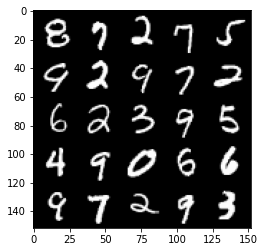

Step 75000: Generator loss: 1.4652148237228386, discriminator loss: 0.4443833386301993


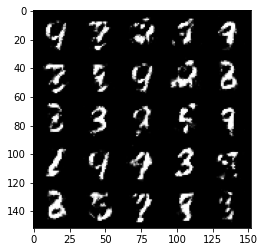

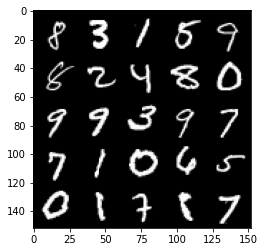

Step 75500: Generator loss: 1.4683203277587897, discriminator loss: 0.44273818546533544


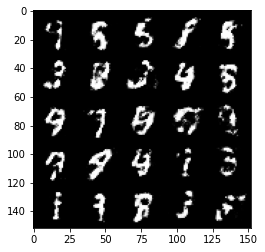

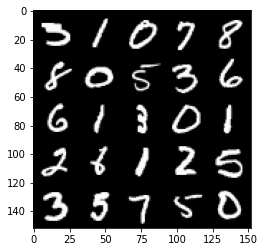

Step 76000: Generator loss: 1.492724677324295, discriminator loss: 0.42563399618864056


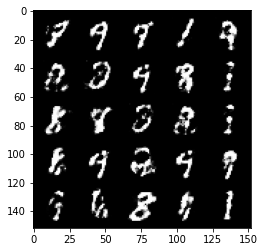

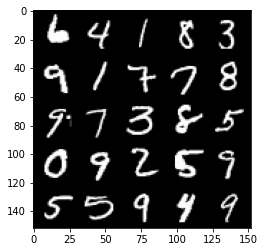

Step 76500: Generator loss: 1.4621741161346442, discriminator loss: 0.44472240585088674


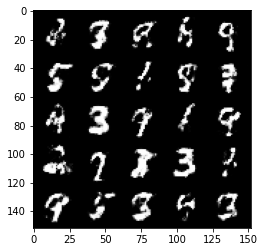

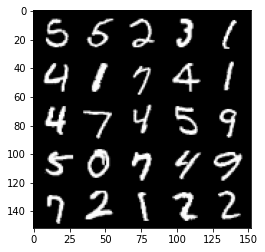

Step 77000: Generator loss: 1.4037865593433387, discriminator loss: 0.45323110628128027


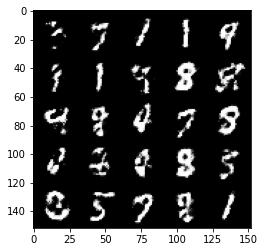

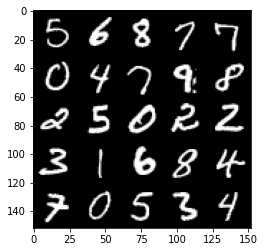

Step 77500: Generator loss: 1.3889396402835834, discriminator loss: 0.4560190604925154


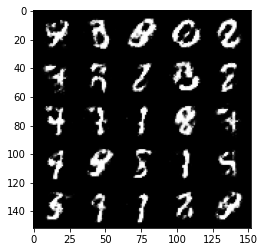

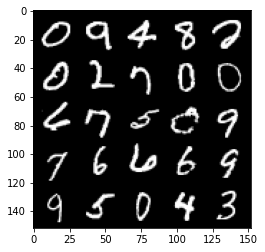

Step 78000: Generator loss: 1.4139358737468732, discriminator loss: 0.44375490558147446


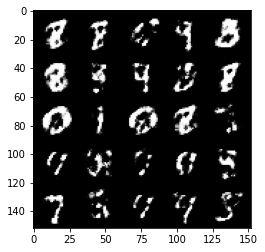

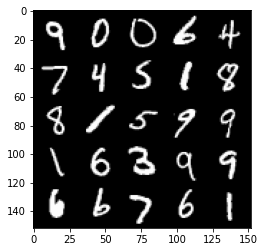

Step 78500: Generator loss: 1.346102841615677, discriminator loss: 0.4613627648353575


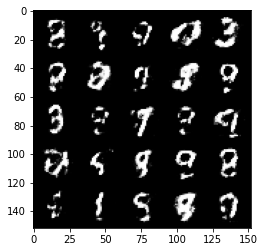

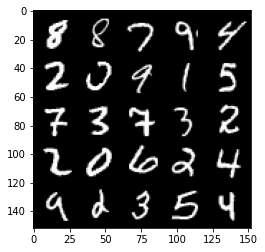

Step 79000: Generator loss: 1.3208801388740536, discriminator loss: 0.47044909936189605


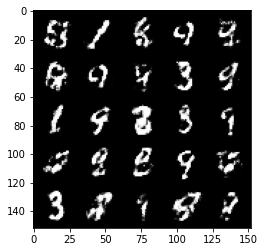

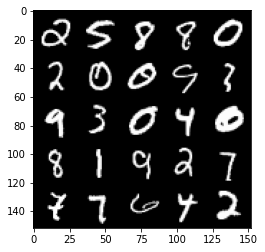

Step 79500: Generator loss: 1.3909884717464438, discriminator loss: 0.4603553749322892


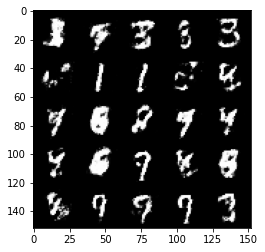

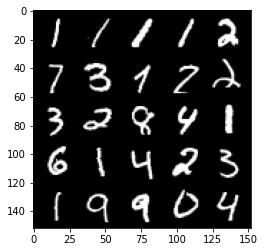

Step 80000: Generator loss: 1.3827287347316743, discriminator loss: 0.45491129934787816


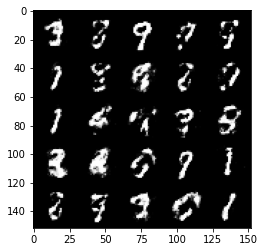

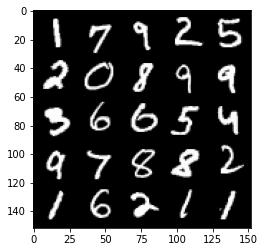

Step 80500: Generator loss: 1.3601753416061397, discriminator loss: 0.46365664380788824


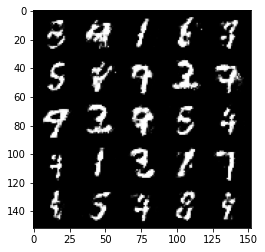

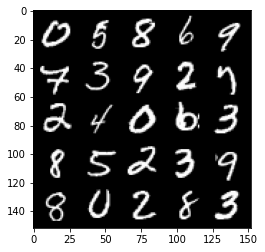

Step 81000: Generator loss: 1.4094466884136194, discriminator loss: 0.4409315270781519


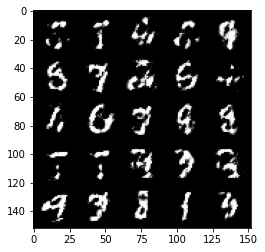

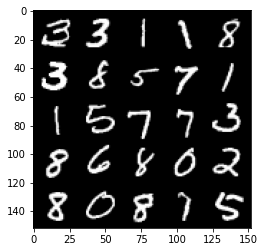

Step 81500: Generator loss: 1.4357429914474495, discriminator loss: 0.4412650148868558


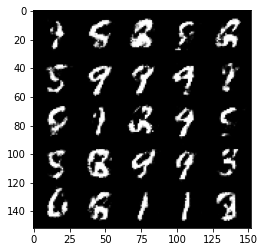

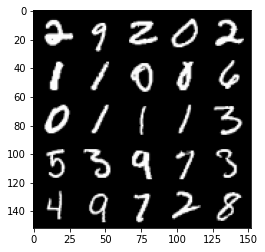

Step 82000: Generator loss: 1.3487264897823354, discriminator loss: 0.4764092574715616


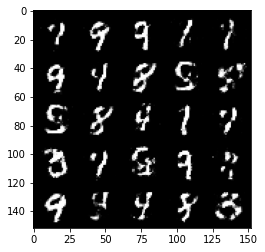

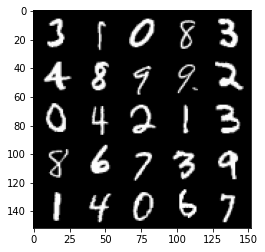

Step 82500: Generator loss: 1.3282085397243482, discriminator loss: 0.4754287479519842


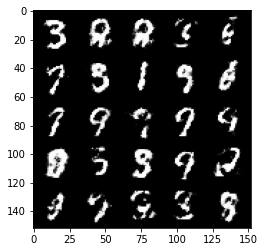

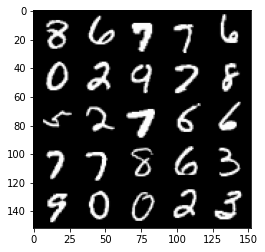

Step 83000: Generator loss: 1.2535423069000247, discriminator loss: 0.49838445156812666


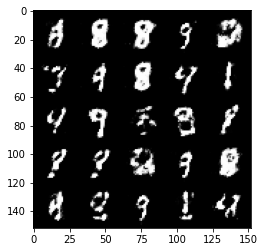

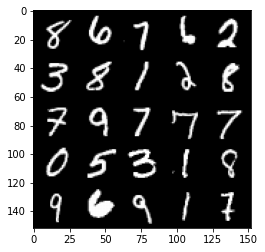

Step 83500: Generator loss: 1.3492666893005383, discriminator loss: 0.46318771988153434


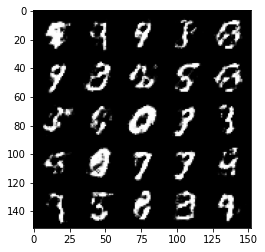

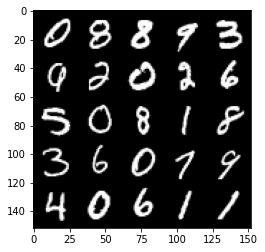

Step 84000: Generator loss: 1.310229066133498, discriminator loss: 0.4728504412174225


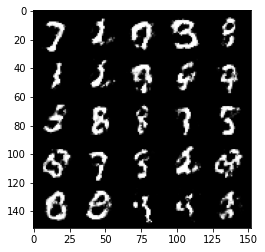

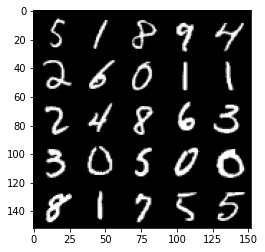

Step 84500: Generator loss: 1.3575927555561051, discriminator loss: 0.4637515953183172


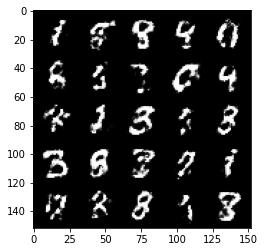

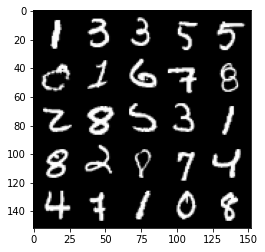

Step 85000: Generator loss: 1.3170641076564777, discriminator loss: 0.47002861273288704


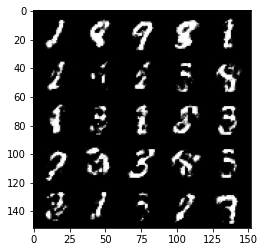

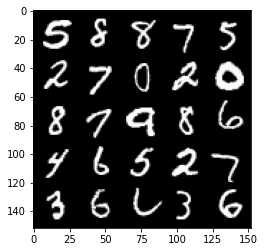

Step 85500: Generator loss: 1.396912264347078, discriminator loss: 0.4389521201848982


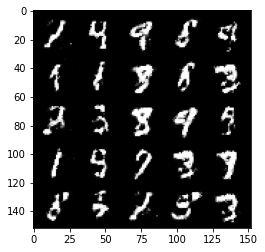

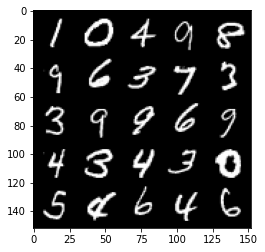

Step 86000: Generator loss: 1.3212329328060162, discriminator loss: 0.4718277245759959


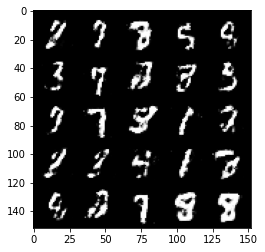

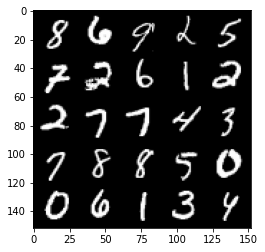

Step 86500: Generator loss: 1.3234311206340783, discriminator loss: 0.4675289706587797


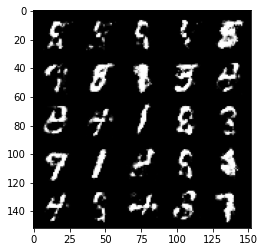

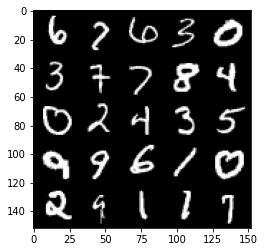

Step 87000: Generator loss: 1.3458179543018338, discriminator loss: 0.45530731779336914


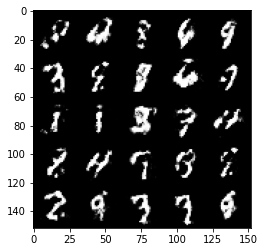

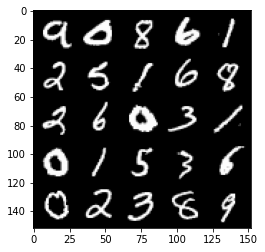

Step 87500: Generator loss: 1.331239004135131, discriminator loss: 0.4762703070044515


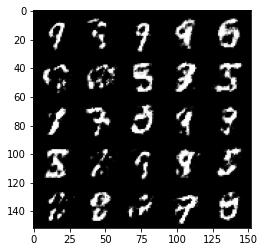

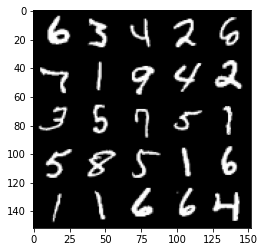

Step 88000: Generator loss: 1.3372021226882942, discriminator loss: 0.4652465602159504


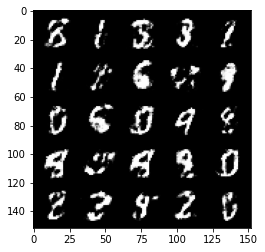

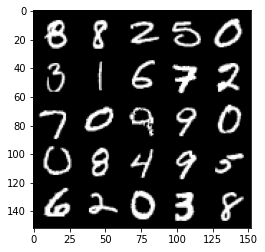

Step 88500: Generator loss: 1.3479735000133513, discriminator loss: 0.46161460030078905


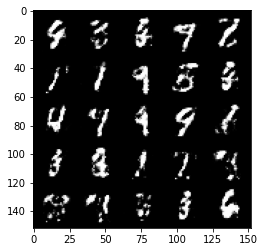

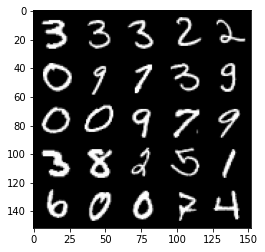

Step 89000: Generator loss: 1.3543441751003251, discriminator loss: 0.45738070625066757


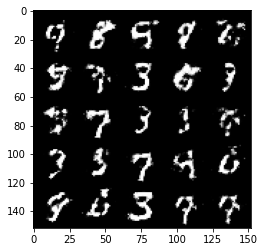

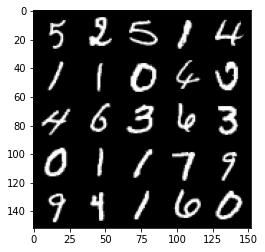

Step 89500: Generator loss: 1.2791719090938547, discriminator loss: 0.482282197415829


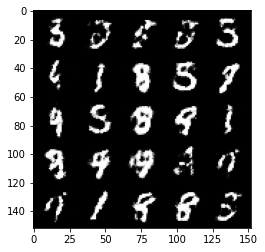

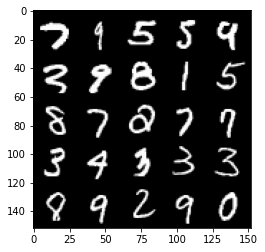

Step 90000: Generator loss: 1.2987362732887267, discriminator loss: 0.46377398598194075


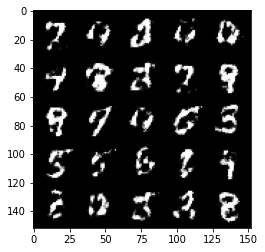

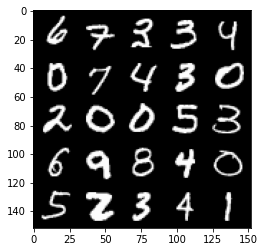

Step 90500: Generator loss: 1.3643992748260503, discriminator loss: 0.4547088994979857


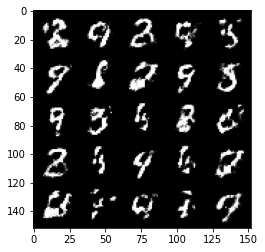

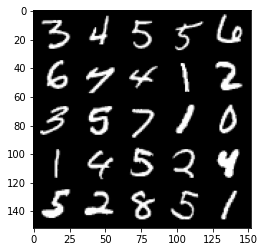

Step 91000: Generator loss: 1.2928335132598876, discriminator loss: 0.4799427600502972


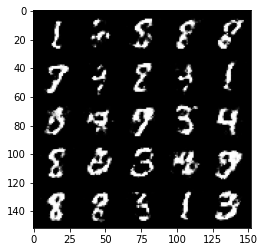

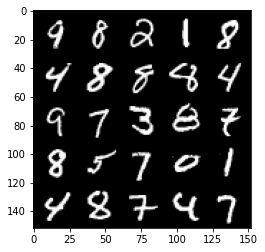

Step 91500: Generator loss: 1.3562264540195463, discriminator loss: 0.46804732972383506


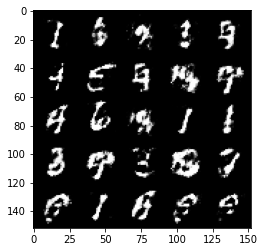

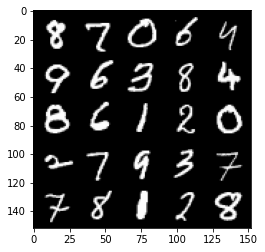

Step 92000: Generator loss: 1.295514680624008, discriminator loss: 0.4781976670026781


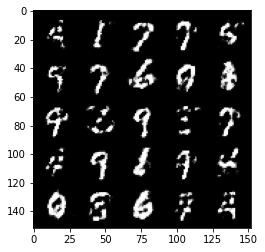

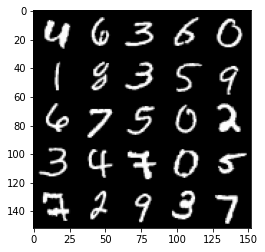

Step 92500: Generator loss: 1.2697950389385222, discriminator loss: 0.48406396383047107


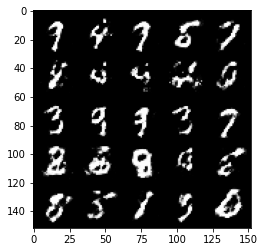

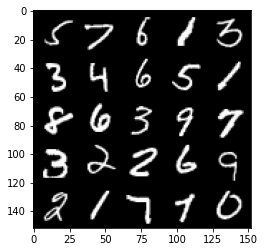

Step 93000: Generator loss: 1.2886448488235467, discriminator loss: 0.4816304602622984


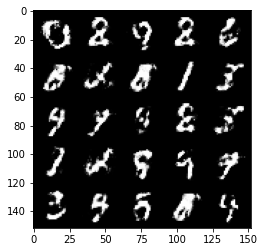

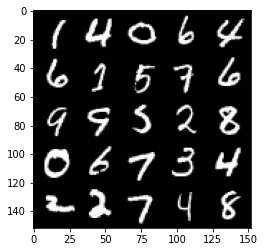

Step 93500: Generator loss: 1.216985546827317, discriminator loss: 0.49626821029186247


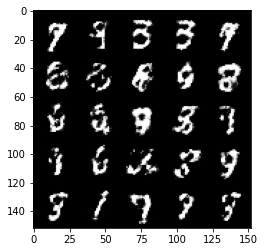

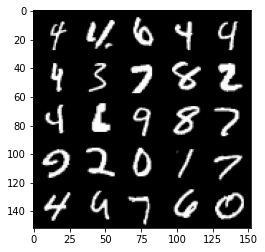

In [ ]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen,disc,criterion,cur_batch_size,z_dim,device)
        gen_loss.backward(retain_graph = True)
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1